### Assess the performance of Cell2Spatial using BRCA ST dataset.
- Author: Huamei Li
- Date: 2023-09-13
- Email: li_hua_mei@163.com
- Institute: Nanjing University

In [1]:
options(warn = -1)
suppressMessages(require(Seurat))
suppressMessages(require(ggplot2))
suppressMessages(require(dplyr))
suppressMessages(require(reticulate))
suppressMessages(require(stringr))
suppressMessages(require(ggpubr))
suppressMessages(require(tidydr))
suppressMessages(require(CellTrek))
suppressMessages(require(CARD))
devtools::load_all('../Cell2Spatial/')

ℹ Loading Cell2Spatial


In [2]:
source('modules/globalParams.R')
source('modules/utils.R')
source('modules/vis.R')
source('modules/reformatProjResNew.R')

In [5]:
out.figs.dir <- '../2.results/hippo/figs'
out.data.dir <- '../2.results/hippo/data'

In [6]:
dir.create(out.figs.dir, showWarnings = FALSE, recursive = TRUE)
dir.create(out.data.dir, showWarnings = FALSE, recursive = TRUE)

In [7]:
MTH_COLOR <- c(
    'Reference'    = 'grey',
    'Cell2Spatial' = '#F7B263',
    'CytoSPACE' = '#D6AA8E',
    'CellTrek' = '#99C0CC',
    'Tangram' = 'lightgreen',
    'Seurat' = '#CC00FF'
)

### Loading kidney ST and SC datasets 

In [8]:
brain.st <- readRDS("../0.data/slide_seq.v2/ssHippo_ST.RDS")

In [9]:
brain.sc <- readRDS("../0.data/slide_seq.v2/mouse_hippocampus_SC.RDS")

In [14]:
brain.st <- brain.st %>% NormalizeData %>% FindVariableFeatures %>% ScaleData

Centering and scaling data matrix



In [544]:
brain.st

An object of class Seurat 
23264 features across 53173 samples within 1 assay 
Active assay: Spatial (23264 features, 0 variable features)
 2 layers present: counts, data
 1 image present: image

In [58]:
colnames(brain.st@images$image@coordinates) <- c('row', 'col')

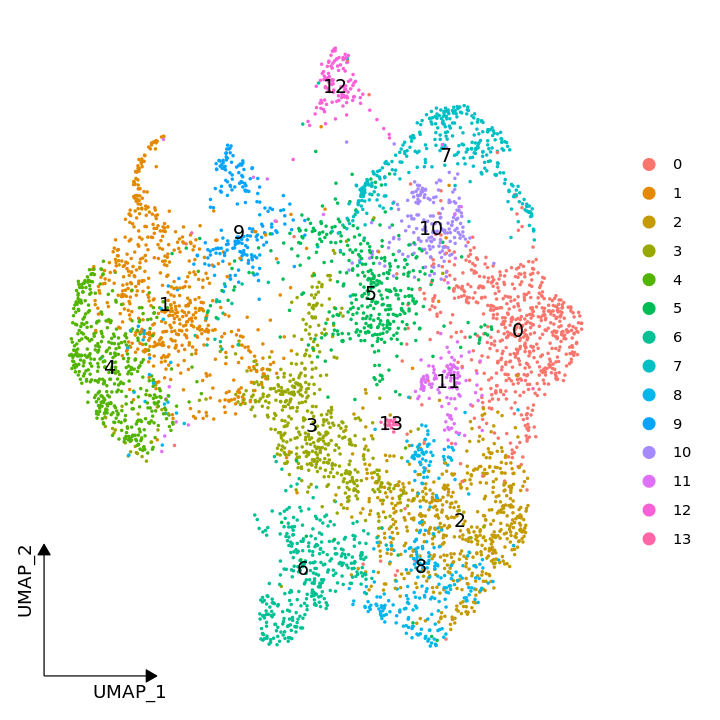

In [146]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.st, reduction = "umap", label = TRUE) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank())
ggsave(file.path(out.figs.dir, 'BRCA.ST.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

In [58]:
Idents(brain.sc) <- brain.sc$celltypeNew

In [154]:
options(future.globals.maxSize = 5000000 * 1024^2, future.seed = TRUE)

brain.sc <- SCTransform(brain.sc, ncells = 3000, verbose = FALSE) %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



In [15]:
set.seed(20240502) 
cell.colors <- randomcoloR::distinctColorPalette(length(unique(brain.sc$celltypeNew))) %>% `names<-`(unique(brain.sc$celltypeNew))

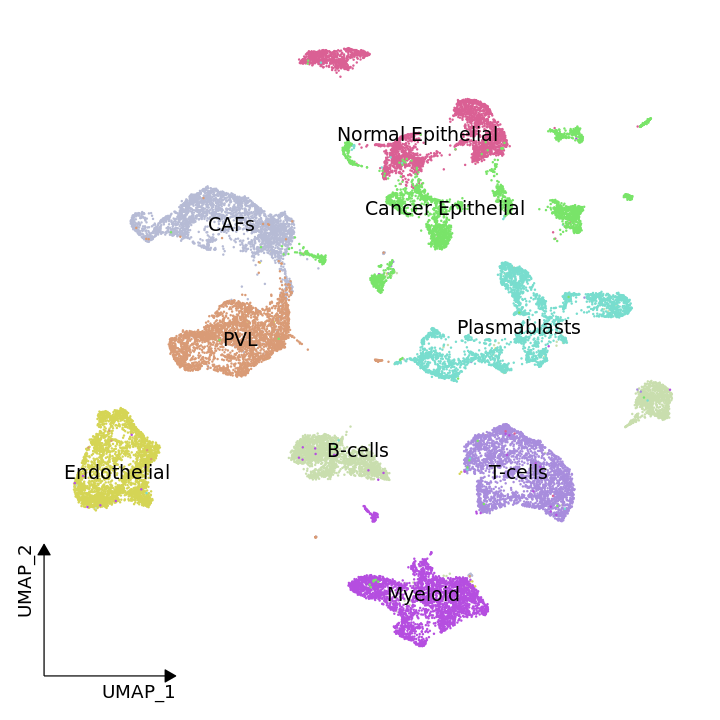

In [156]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.sc, label = TRUE, cols = cell.colors) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank()) + NoLegend()
ggsave(file.path(out.figs.dir, 'thymus.SC.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

In [157]:
levels(brain.sc) %>% length

[1] 9

In [315]:
dim(brain.sc)

[1] 23877 27000

In [316]:
dim(brain.st)

[1] 19451  4784

In [548]:
sum(GetAssayData(brain.st, slot = 'counts') == 0)
sum(GetAssayData(brain.st, slot = 'counts') > 0)

[1] 1214654898

[1] 22361774

In [552]:
brain.st

An object of class Seurat 
23264 features across 53173 samples within 1 assay 
Active assay: Spatial (23264 features, 0 variable features)
 2 layers present: counts, data
 1 image present: image

In [551]:
brain.sc

An object of class Seurat 
50198 features across 52846 samples within 2 assays 
Active assay: SCT (22245 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [549]:
1214654898 / (1214654898 + 22361774)

[1] 0.9819228

In [550]:
min(colSums(GetAssayData(brain.st, slot = 'counts')))
median(colSums(GetAssayData(brain.st, slot = 'counts')))

[1] 10

[1] 302

In [158]:
#markers <- FindAllMarkers(brain.st, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')

In [159]:
#openxlsx::write.xlsx(markers, file = file.path(out.data.dir, 'Thymus.ST.markers.xlsx'))

In [160]:
#top20.markers <- markers %>% group_by(cluster) %>% top_n(n = 50, wt = avg_log2FC)

In [161]:
#saveRDS(brain.sc, file = file.path(out.data.dir, 'brain.sc.RDS'))
#saveRDS(brain.st, file = file.path(out.data.dir, 'brain.st.RDS'))

### Showing the projection performance for Cell2Spatial

In [545]:
cell2spatial <- readRDS('../2.results/hippo/hippo.cell2spatial.RDS')

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell2spatial, group.by = 'Cell2Spatial', pt.size = 1.0,  stroke = NA, cols = cell.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'cell2spatial.entire.UMAP.pdf'), width = 8, height = 6)

In [493]:
length(cell2spatial$Cell2Spatial %>% unique)

[1] 16

In [494]:
f.ctypes <- cell2spatial$Cell2Spatial %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell2spatial, Cell2Spatial == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(cell2spatial, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

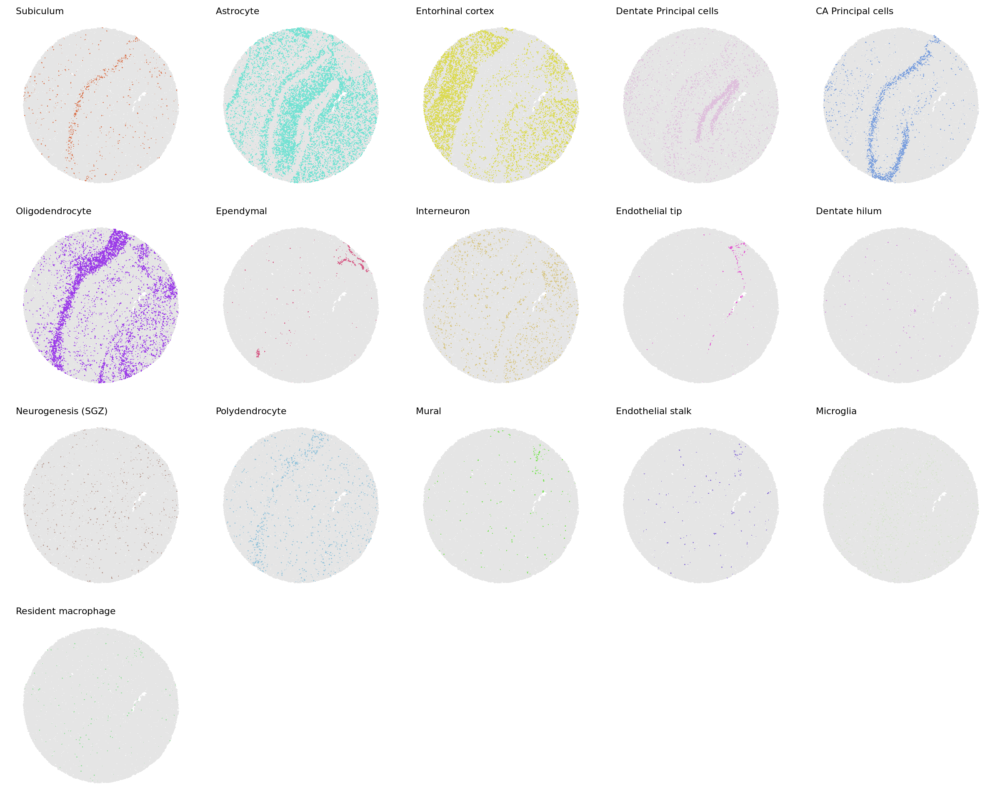

In [495]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.eps'), width = 20, height = 16)

### Showing the projection performance for CytoSpace

In [371]:
cytospace <- forCytoSpace('../2.results/hippo/cytospace/', brain.sc, brain.st)

In [372]:
cells <- cytospace@meta.data[!duplicated(cytospace@meta.data$SpotID), ] %>% rownames
cytospace <- cytospace[, cells]
head(cytospace@meta.data)

,UniqueCID,OriginalCID,CellType,SpotID,row,col
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
UCID00000,UCID00000,P60HippoRep2P1_CTTGGCCTCGCA,Ependymal,CACGTGCCCTCCAC,4697.2,1803.4
UCID00001,UCID00001,P60HippoRep4P3_GCGTCCAATCGA,Ependymal,GCCACTGAAATGTT,1266.9,3631.8
UCID00002,UCID00002,P60HippoRep1P2_GTCTGGCTGCGG,Ependymal,CAAGCCGCCACCTC,3159.7,4394.0
UCID00003,UCID00003,P60HippoRep3P1_CCGGTTGGCAAC,Ependymal,GCCGCGAAGAATGT,4635.7,1880.5
UCID00004,UCID00004,P60HippoRep2P1_GCCCATACCTCG,Ependymal,GCTAGCTGGTGTAC,4727.9,1870.2
UCID00005,UCID00005,P60HippoRep4P1_GCTGGTCCGGCG,Ependymal,GCGCCTCCCACGTC,1914.1,5117.2


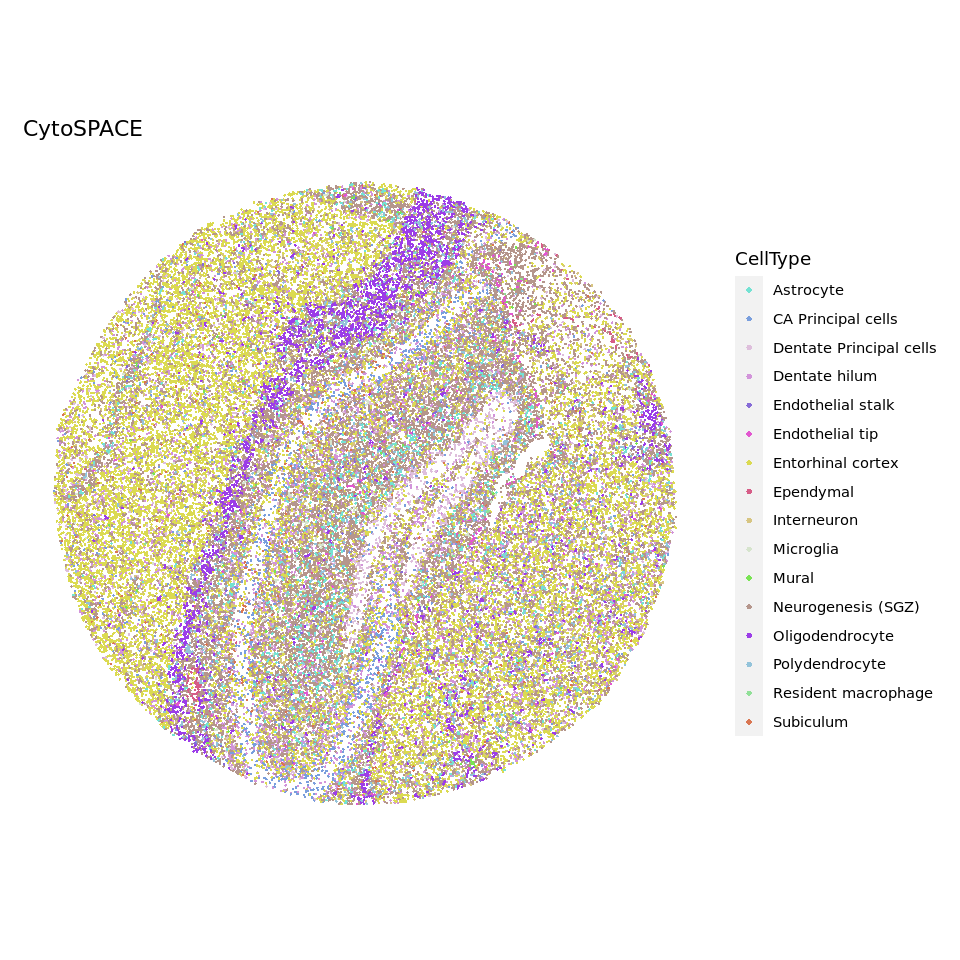

In [373]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cytospace, group.by = 'CellType', pt.size = 1.0, cols = cell.colors, stroke = NA) + ggtitle('CytoSPACE')
ggsave(file.path(out.figs.dir, 'cytospace.entire.UMAP.pdf'), width = 8, height = 6)

In [374]:
length(cytospace$CellType %>% unique)

[1] 16

In [375]:
f.ctypes <- cytospace$CellType  %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cytospace, CellType == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(cytospace, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

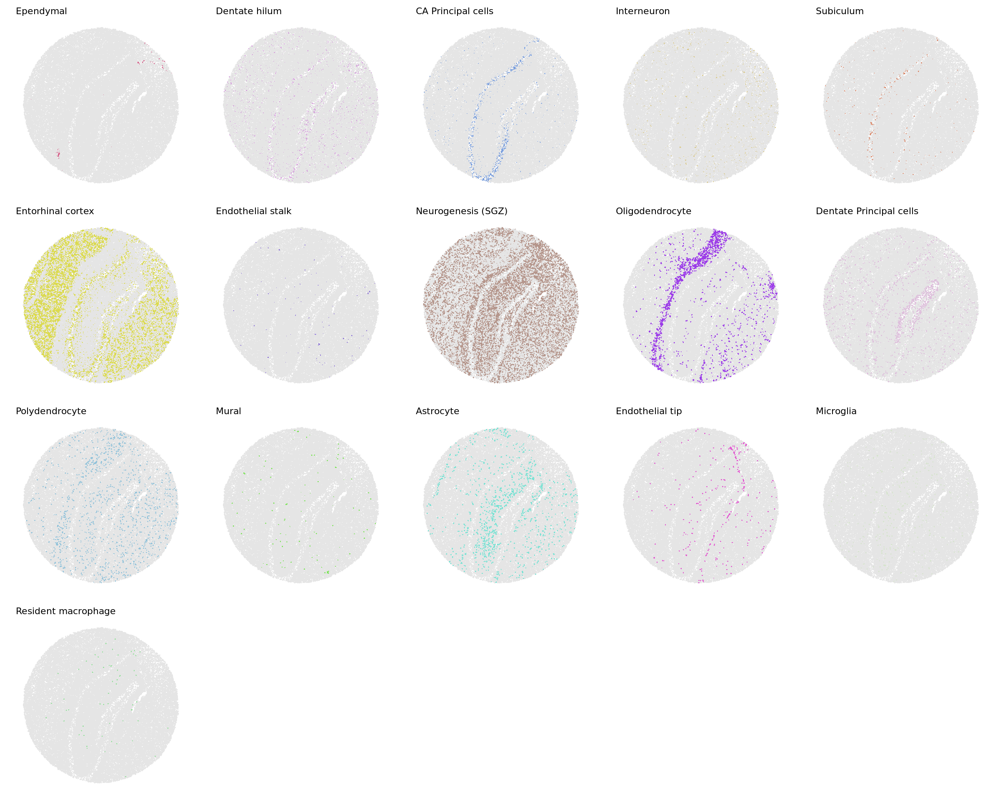

In [376]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.eps'), width = 20, height = 16)

### Showing the projection performance for tangram

In [377]:
colnames(brain.st@images$image@coordinates) <- c('row', 'col')

In [378]:
tangram <- forTangram('../2.results/hippo/hippo_tangram.xls', brain.sc, brain.st)

In [379]:
tangram@meta.data %>% head

,X,orig.ident,nCount_RNA,nFeature_RNA,cluster,subcluster,reason,nCount_SCT,nFeature_SCT,celltype,⋯,region,common_name,celltypeNew,SpotID,row,col,NA,NA.1,x.new,y.new
,<chr>,<int>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>
P60HippoRep1P1_CTACGCGCATGN,P60HippoRep1P1_CTACGCGCATGN,0,42200,8401,10,95,-2147483648,5240,2877,1,⋯,hippocampus,celltype,Ependymal,AATGAGACTGGTCT,5585.4,2678.1,AATGAGACTGGTCT,AATGAGACTGGTCT,5588.642,2679.964
P60HippoRep1P1_GCGTGGCGCGTA,P60HippoRep1P1_GCGTGGCGCGTA,0,32623,6356,5,71,-2147483648,3089,2076,15,⋯,hippocampus,celltype,CA Principal cells,TCGGGACAGGGTCA,2105.9,3527.8,TCGGGACAGGGTCA,TCGGGACAGGGTCA,2097.547,3523.433
P60HippoRep1P1_GTGCAGACGCAG,P60HippoRep1P1_GTGCAGACGCAG,0,32554,6394,5,68,-2147483648,2991,2053,2,⋯,hippocampus,celltype,CA Principal cells,CTAGTAGTCTTGAG,1530.8,4166.5,CTAGTAGTCTTGAG,CTAGTAGTCTTGAG,1538.284,4170.217
P60HippoRep1P1_CGATAAATGCAT,P60HippoRep1P1_CGATAAATGCAT,0,29920,6214,5,68,-2147483648,3048,2075,2,⋯,hippocampus,celltype,CA Principal cells,TTGGGAACACTAAC,4907.5,1784.9,TTGGGAACACTAAC,TTGGGAACACTAAC,4902.120,1781.415
P60HippoRep1P1_CTGGCGAAGAAC,P60HippoRep1P1_CTGGCGAAGAAC,0,29633,6176,5,68,-2147483648,3109,2182,2,⋯,hippocampus,celltype,CA Principal cells,GTTCGCTAGAAGCA,1946.5,4824.6,GTTCGCTAGAAGCA,GTTCGCTAGAAGCA,1941.304,4827.074
P60HippoRep1P1_GGTACAGAGGCG,P60HippoRep1P1_GGTACAGAGGCG,0,29316,5912,5,68,-2147483648,3050,2050,2,⋯,hippocampus,celltype,CA Principal cells,CTAGCACCACACTA,2823.3,3854.4,CTAGCACCACACTA,CTAGCACCACACTA,2822.226,3854.104


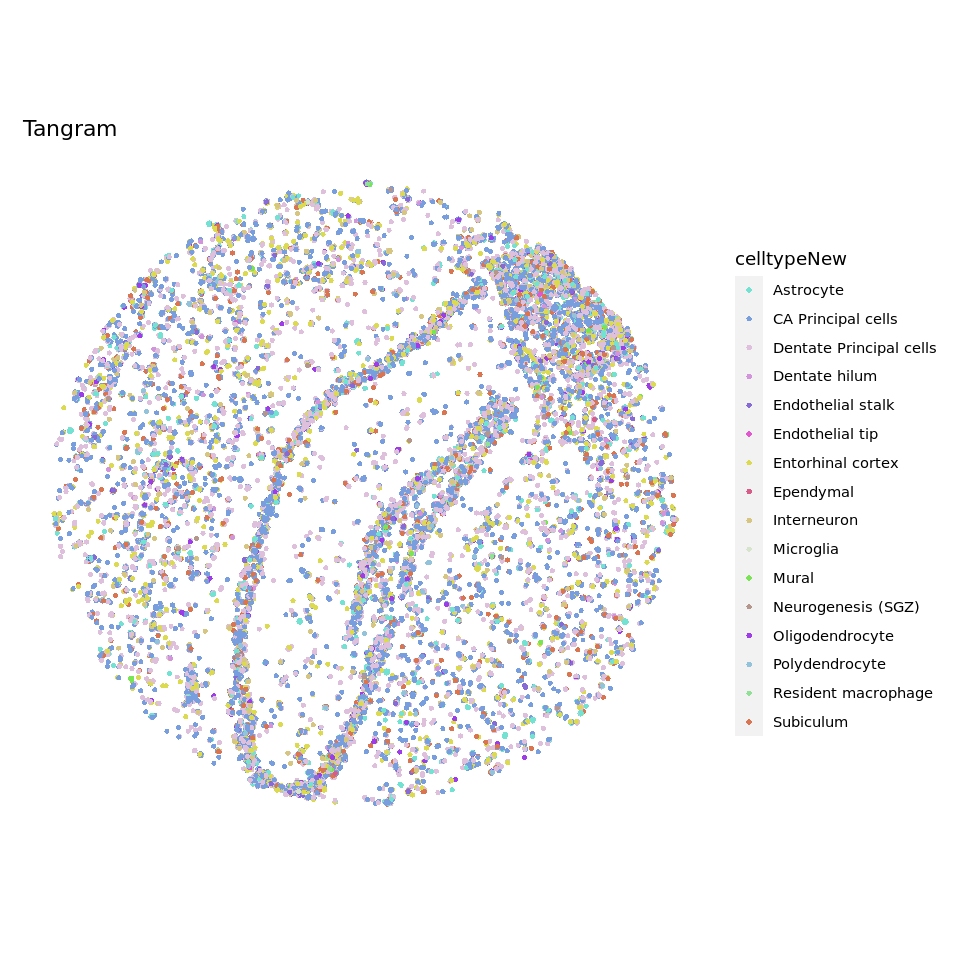

In [380]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(tangram, group.by = 'celltypeNew', pt.size = 2.0,  cols = cell.colors, stroke = NA) + ggtitle('Tangram')
ggsave(file.path(out.figs.dir, 'tangram.entire.UMAP.pdf'), width = 8, height = 6)

In [381]:
length(f.ctypes <- tangram$celltypeNew %>% unique)

[1] 16

In [382]:
f.ctypes <- tangram$celltypeNew %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(tangram, celltypeNew == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(tangram, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

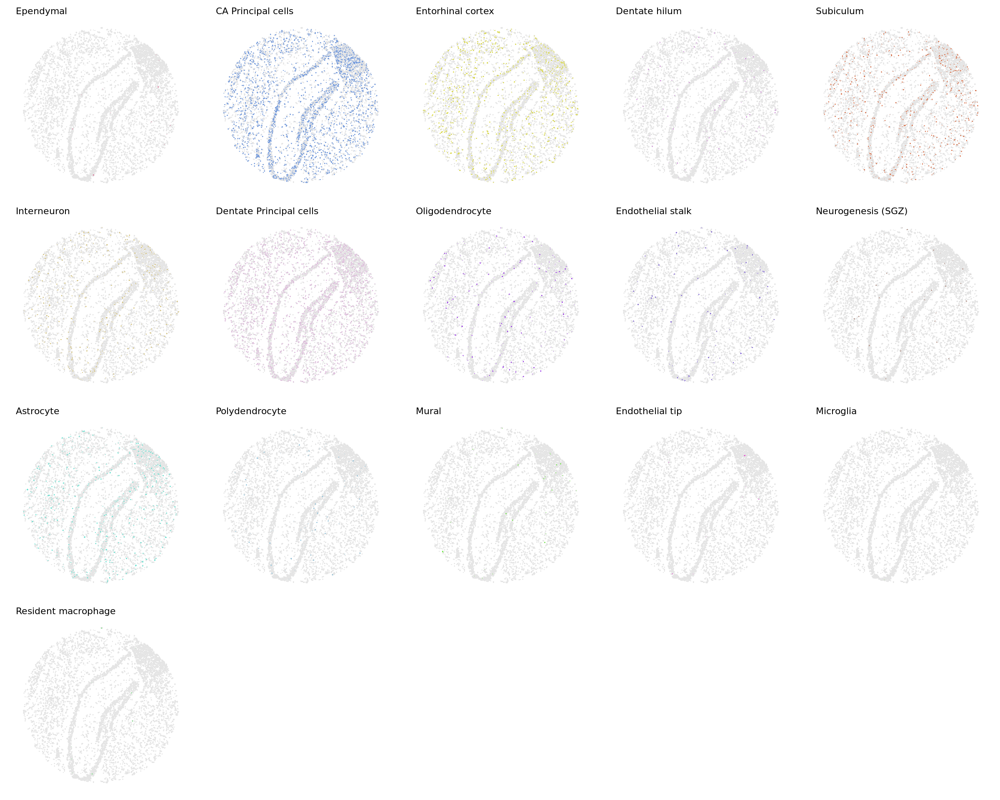

In [383]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.eps'), width = 20, height = 16)

### Showing the projection performance for Seurat

In [384]:
seurat.res <- readRDS('../2.results/hippo/slide.seq.res.RDS') 

In [385]:
seurat.res@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,spot_class,first_type,second_type,first_class,second_class,min_score,singlet_score,conv_all,conv_doublet
,<fct>,<dbl>,<int>,<fct>,<fct>,<fct>,<lgl>,<lgl>,<dbl>,<dbl>,<lgl>,<lgl>
AACGTCATAATCGT,SlideSeq,23772,6539,doublet_certain,Entorhinal cortex,Astrocyte,FALSE,FALSE,5231.364,5712.434,TRUE,TRUE
TACTTTAGCGCAGT,SlideSeq,19661,6017,doublet_certain,Entorhinal cortex,Astrocyte,FALSE,FALSE,5000.350,5915.796,TRUE,TRUE
CATGCCTGGGTTCG,SlideSeq,15999,5319,doublet_certain,Entorhinal cortex,Astrocyte,FALSE,FALSE,4376.142,4706.389,TRUE,TRUE
TCGATATGGCACAA,SlideSeq,15069,5554,doublet_certain,Entorhinal cortex,Astrocyte,FALSE,FALSE,4784.350,5359.721,TRUE,TRUE
TTATCTGACGAAGC,SlideSeq,14013,4946,doublet_certain,Entorhinal cortex,Astrocyte,FALSE,FALSE,4326.145,4770.155,TRUE,TRUE
GATGCGACTCCTCG,SlideSeq,12722,4355,doublet_certain,CA Principal cells,Astrocyte,FALSE,FALSE,3633.386,3661.529,TRUE,TRUE


In [386]:
seurat.res$first_type <- as.vector(seurat.res$first_type)

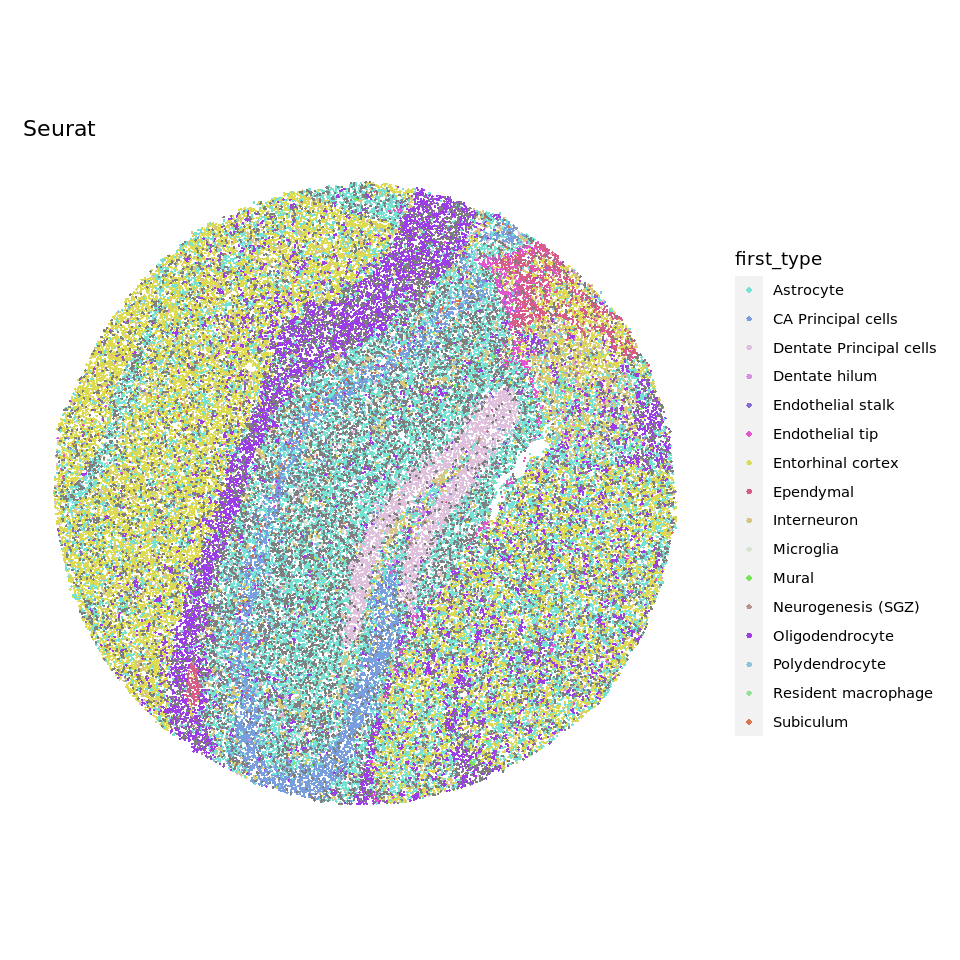

In [387]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(seurat.res, group.by = 'first_type', pt.size = 1.0, cols = cell.colors, stroke = NA) + ggtitle('Seurat')
ggsave(file.path(out.figs.dir, 'seurat.entire.UMAP.pdf'), width = 8, height = 6)

In [388]:
seurat.res <- subset(seurat.res, first_type %in% names(table(seurat.res$first_type)))

In [389]:
length(f.ctypes <- seurat.res$first_type %>% unique)

[1] 16

In [390]:
f.ctypes

[1] "Entorhinal cortex"       "CA Principal cells"     
 [3] "Oligodendrocyte"         "Astrocyte"              
 [5] "Ependymal"               "Interneuron"            
 [7] "Dentate Principal cells" "Subiculum"              
 [9] "Dentate hilum"           "Endothelial tip"        
[11] "Polydendrocyte"          "Neurogenesis (SGZ)"     
[13] "Microglia"               "Endothelial stalk"      
[15] "Mural"                   "Resident macrophage"

In [391]:
f.ctypes <- seurat.res$first_type %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(seurat.res, first_type == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(seurat.res, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

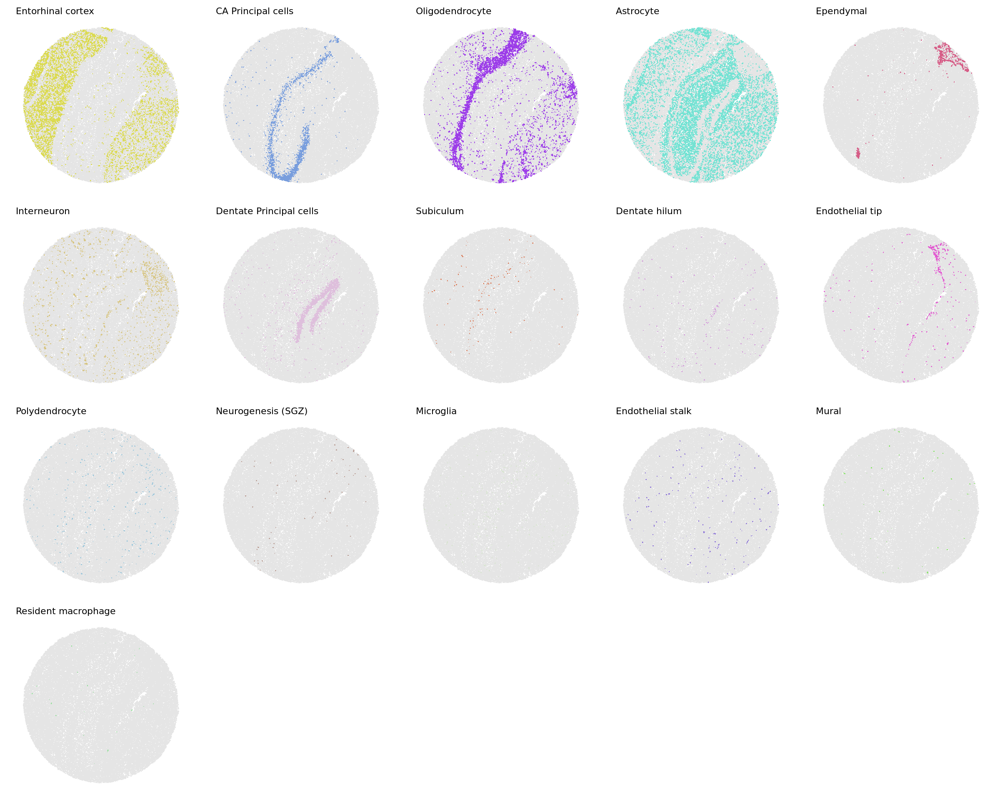

In [392]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.eps'), width = 20, height = 16)

#### Compare the marker gene expression

In [393]:
options(future.globals.maxSize = 50000000 * 1024^2, future.seed = TRUE)

In [455]:
seurat.res$predicted.id <- seurat.res$first_type

In [396]:
Idents(seurat.res) <- seurat.res$predicted.id
de.markers <- FindAllMarkers(seurat.res, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25)

Calculating cluster Entorhinal cortex

Calculating cluster CA Principal cells

Calculating cluster Oligodendrocyte

Calculating cluster Astrocyte

Calculating cluster Ependymal

Calculating cluster Interneuron

Calculating cluster Dentate Principal cells

Calculating cluster Subiculum

Calculating cluster Dentate hilum

Calculating cluster Endothelial tip

Calculating cluster Polydendrocyte

Calculating cluster Neurogenesis (SGZ)

Calculating cluster Microglia

Calculating cluster Endothelial stalk

Calculating cluster Mural

Calculating cluster Resident macrophage



In [397]:
top5.markers <- de.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)
top5.markers <- split(top5.markers$gene, top5.markers$cluster)

In [457]:
cytospace <- AddModuleScore(cytospace %>% NormalizeData, features = top5.markers)
cell2spatial <- AddModuleScore(cell2spatial %>% NormalizeData, features = top5.markers)
tangram <- AddModuleScore(tangram %>% NormalizeData, features = top5.markers)
seurat.res <- AddModuleScore(seurat.res %>% NormalizeData, features = top5.markers)

In [458]:
tar.ctypes <- c("Dentate Principal cells", "CA3 Principal cells", "Entorhinal cortex", "Endothelial tip", "Ependymal", "Oligodendrocyte")
tar.ctypes <- intersect(tar.ctypes, levels(seurat.res))
idxes <- which(names(top5.markers) %in% tar.ctypes)
tar.ctypes

[1] "Dentate Principal cells" "Entorhinal cortex"      
[3] "Endothelial tip"         "Ependymal"              
[5] "Oligodendrocyte"

In [459]:
obj.tmp <- subset(seurat.res %>% NormalizeData %>% ScaleData, idents = tar.ctypes)
levels(obj.tmp) <- tar.ctypes

Centering and scaling data matrix



In [460]:
gp <- DoHeatmap(obj.tmp, group.by = 'predicted.id', features = top5.markers[tar.ctypes] %>% unlist %>% unique, group.colors = cell.colors[tar.ctypes]) + scale_fill_gradientn(colors = c("gray", "white", "red"))
ggsave(file.path(out.figs.dir, 'marker.expr.pdf'), width = 5, height = 8)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


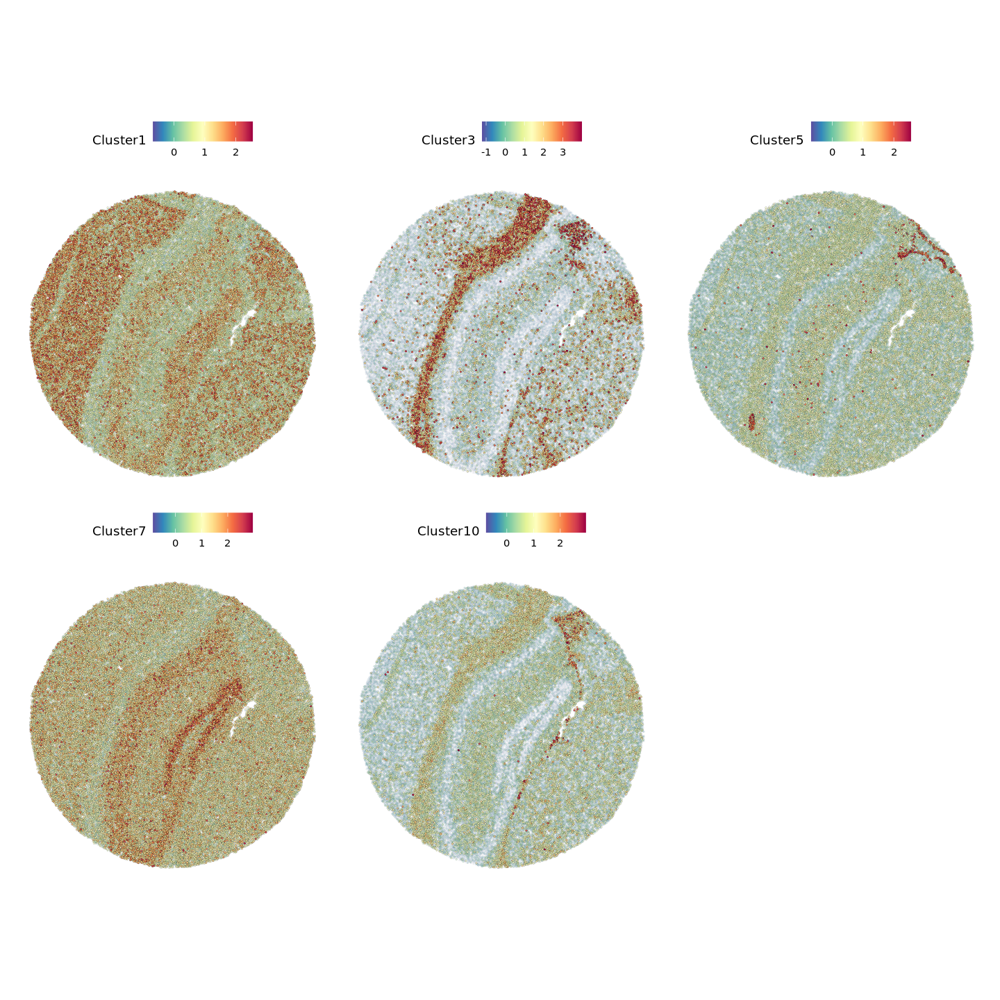

In [461]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(cell2spatial %>% NormalizeData, features = paste0('Cluster', idxes), alpha = c(0, 1))
ggsave(file.path(out.figs.dir, 'cell2spatial.markers.pdf'), width = 12, height = 12)

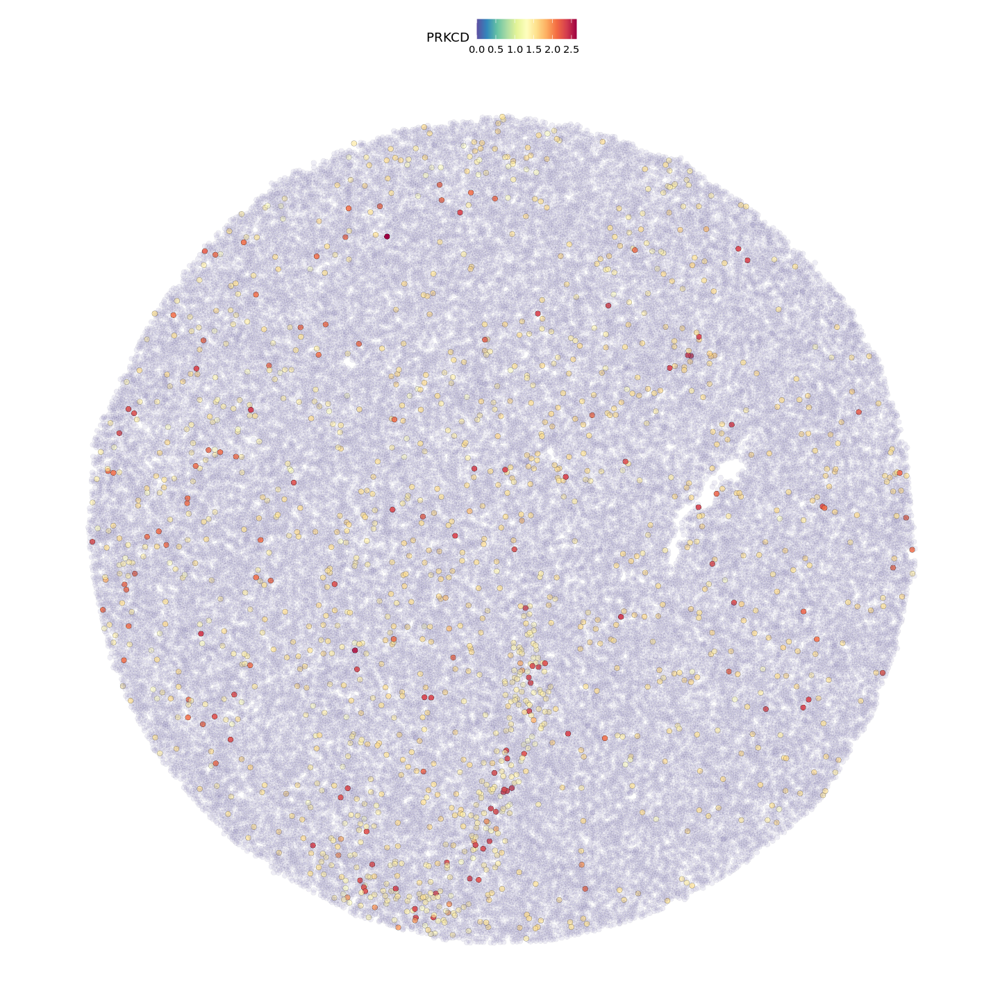

In [531]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(cell2spatial %>% NormalizeData, features = 'PRKCD', alpha = c(0.1, 1))
ggsave(file.path(out.figs.dir, 'cell2spatial.markers.pdf'), width = 12, height = 12)

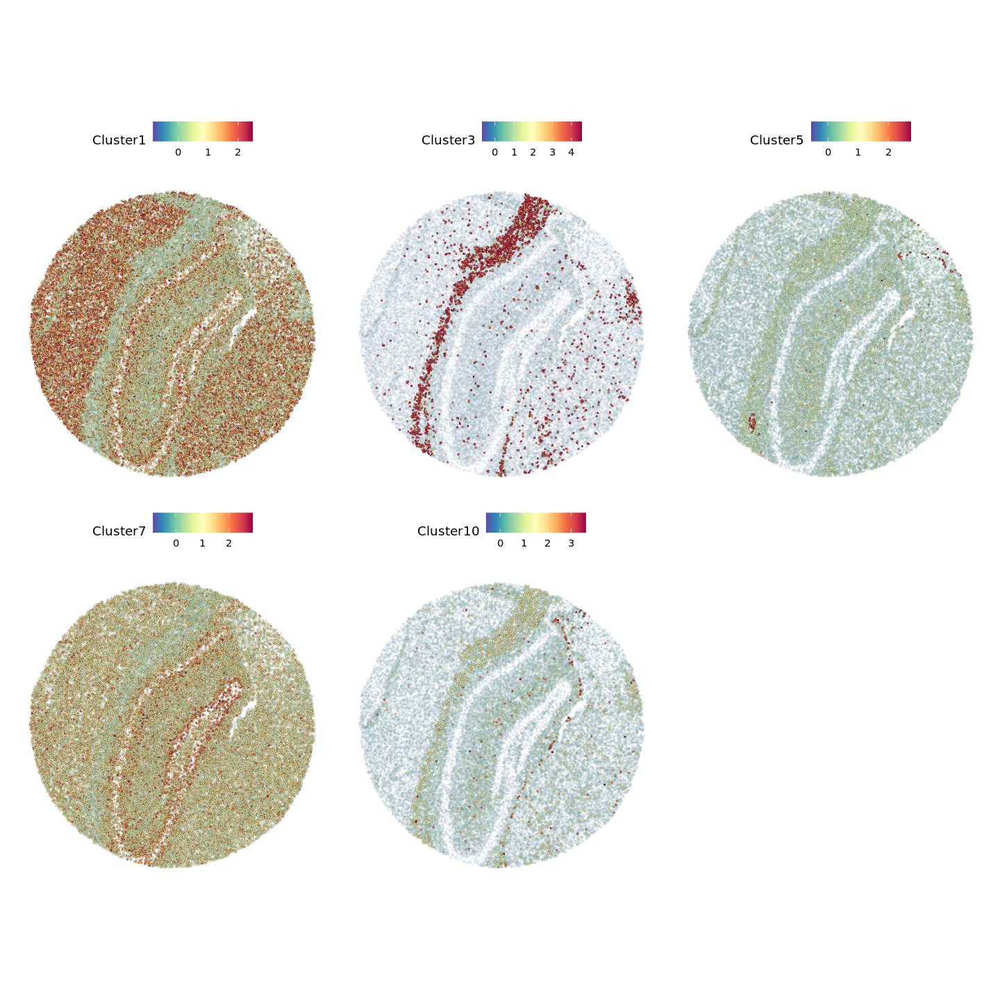

In [462]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(cytospace %>% NormalizeData, features = paste0('Cluster', idxes), alpha = c(0, 1))
ggsave(file.path(out.figs.dir, 'cytospace.markers.pdf'), width = 12, height = 12)

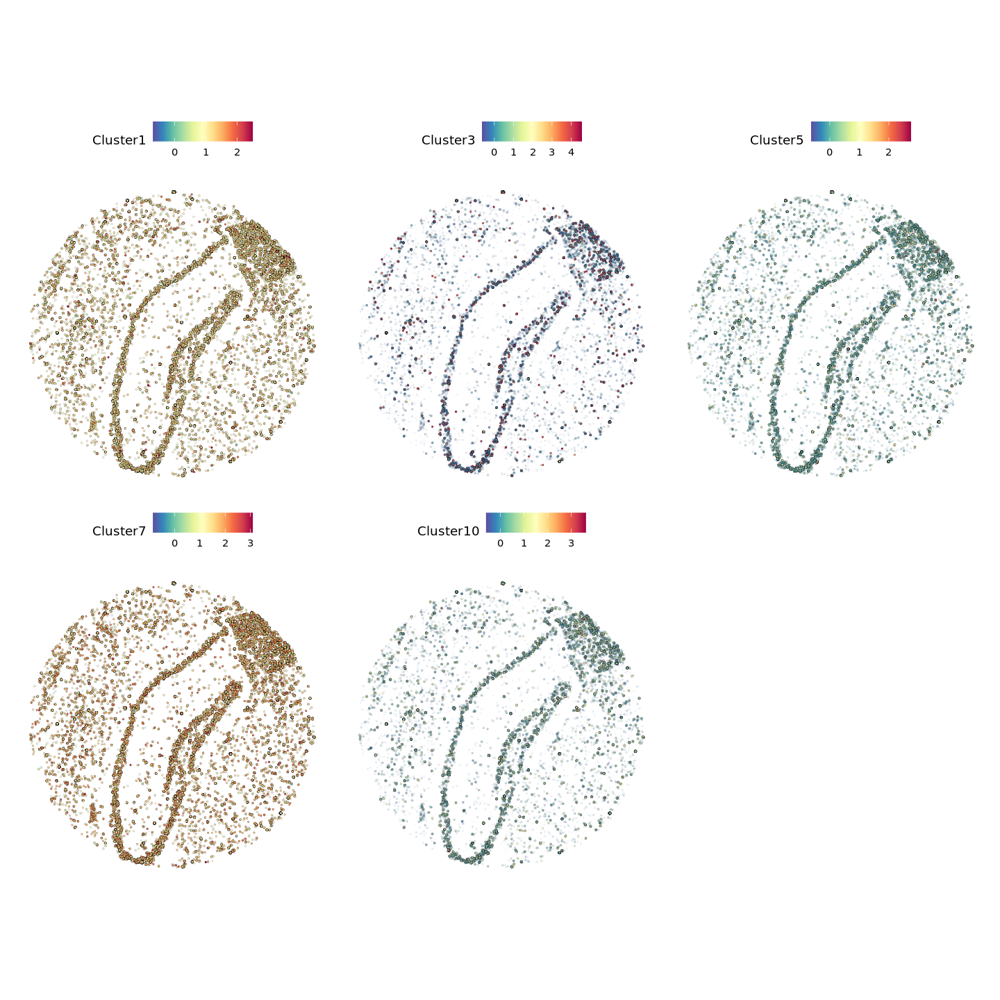

In [463]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(tangram %>% NormalizeData, features = paste0('Cluster', idxes), alpha = c(0, 1))
ggsave(file.path(out.figs.dir, 'tangram.markers.pdf'), width = 12, height = 12)

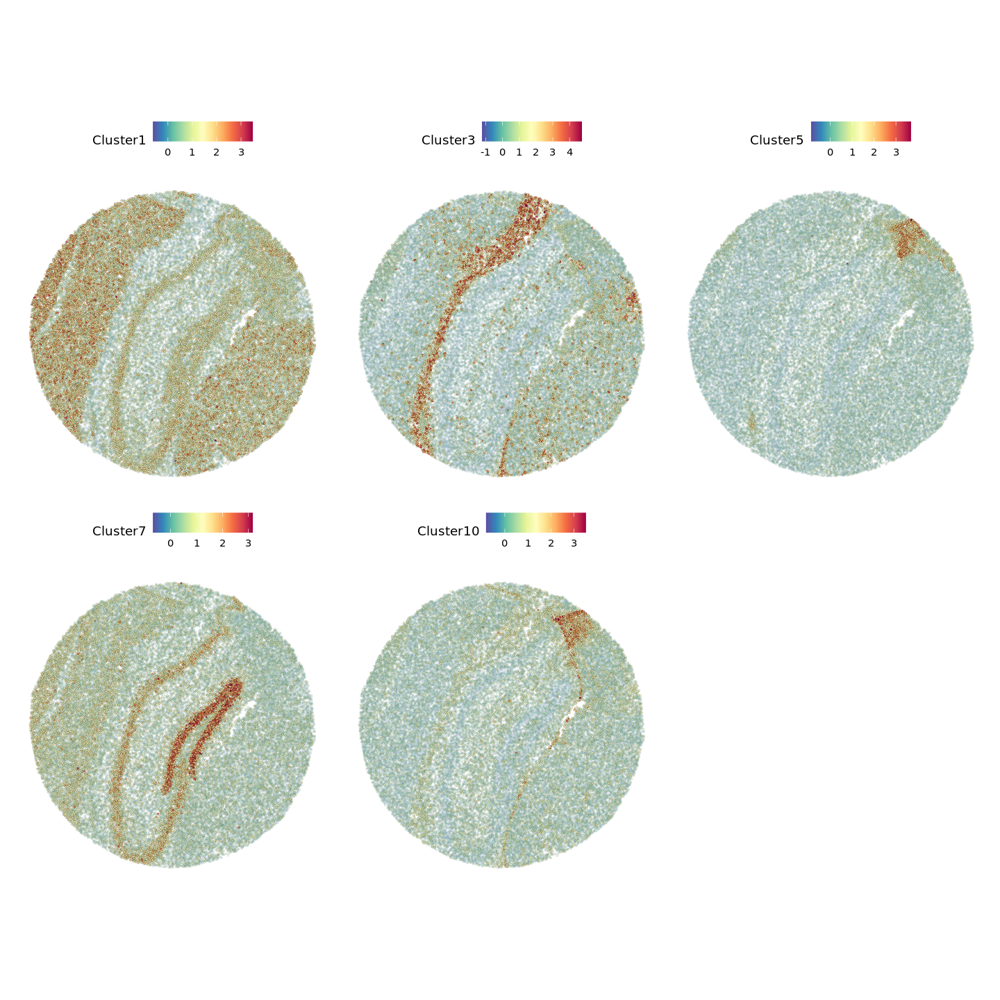

In [464]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(seurat.res, features = paste0('Cluster', idxes), alpha = c(0, 1)) #& scale_fill_gradientn(colors = c("gray90", "white", "red"))
ggsave(file.path(out.figs.dir, 'seurat.markers.pdf'), width = 12, height = 12)

In [533]:
library(ggpointdensity)
library(viridis)

In [538]:
cytospace <- AddModuleScore(cytospace %>% NormalizeData, features = top5.markers)
cell2spatial <- AddModuleScore(cell2spatial %>% NormalizeData, features = top5.markers)
tangram <- AddModuleScore(tangram %>% NormalizeData, features = top5.markers)
seurat.res <- AddModuleScore(seurat.res %>% NormalizeData, features = top5.markers)

In [539]:
scatterPlot <- function(seurat.res, cytospace, idx, spot.col = 'SpotID') {
    idx <- paste0('Cluster', idx)
    meta.1 <- seurat.res@meta.data
    meta.2 <- cytospace@meta.data
    meta.2 <- meta.2[!duplicated(meta.2[, spot.col]), ]
    rownames(meta.2) <- meta.2[, spot.col]
    ovp.sopts <- intersect(rownames(meta.1), rownames(meta.2))
    var1 <- meta.1[ovp.sopts, idx]
    var2 <- meta.2[ovp.sopts, idx]  
    plot.df <- cbind.data.frame(True = var1, Tool = var2)
    gp <- ggplot(plot.df, aes(x = True, y = Tool)) +  geom_pointdensity() + geom_smooth(method = lm, color = 'red') + scale_color_viridis() + stat_cor()    
}

In [540]:
gps <- lapply(idxes, function(idx) {
    scatterPlot(seurat.res, cytospace, idx)   
})

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


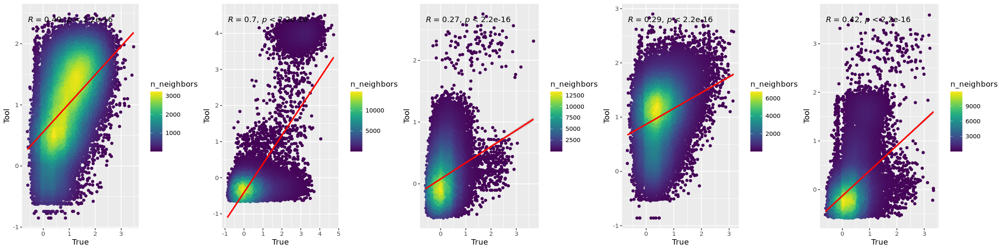

In [541]:
options(repr.plot.width = 20, repr.plot.height = 5)
ggarrange(plotlist = gps, ncol = 5)
ggsave(file.path(out.figs.dir, 'cytospace.markers.exp.pdf'), width = 20, height = 5)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


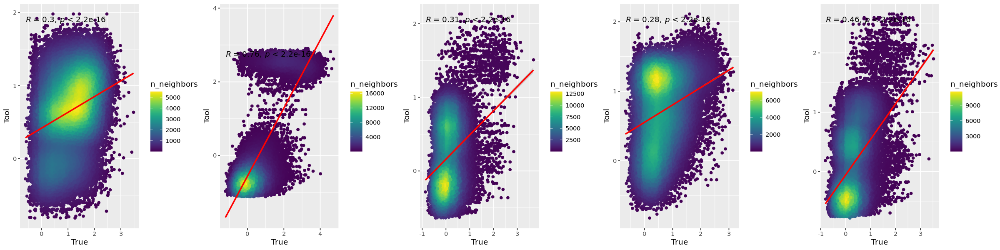

In [542]:
gps <- lapply(idxes, function(idx) {
    scatterPlot(seurat.res, cell2spatial, idx, spot.col = 'SpotName')   
})

options(repr.plot.width = 20, repr.plot.height = 5)
ggarrange(plotlist = gps, ncol = 5)
ggsave(file.path(out.figs.dir, 'cell2spatial.markers.exp.pdf'), width = 20, height = 5)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


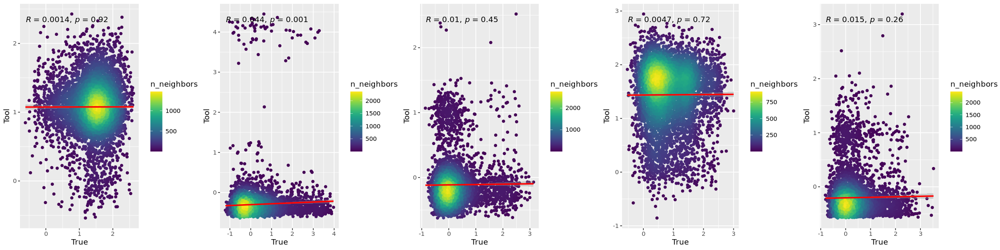

In [543]:
gps <- lapply(idxes, function(idx) {
    scatterPlot(seurat.res, tangram, idx, spot.col = 'SpotID')   
})

options(repr.plot.width = 20, repr.plot.height = 5)
ggarrange(plotlist = gps, ncol = 5)
ggsave(file.path(out.figs.dir, 'tangram.markers.exp.pdf'), width = 20, height = 5)

#### Accuracy analysis

In [471]:
seurat.res$predicted.id <- seurat.res$first_type

In [472]:
true.res <- seurat.res$predicted.id
cell2sp.pres <- cell2spatial@meta.data

In [473]:
meta.cyto <- cytospace@meta.data
meta.cyto <- meta.cyto[!duplicated(meta.cyto$SpotID), ]
cyto.pres <- meta.cyto$CellType %>% `names<-`(meta.cyto$SpotID)

In [474]:
cell2sp.pres <- cell2spatial@meta.data$Cell2Spatial %>% `names<-`(cell2spatial$SpotName)
cell2sp.pres <- lapply(unique(seurat.res$predicted.id), function(idx) {
    spots.1 <- true.res[true.res == idx] %>% names
    spots.2 <- cell2sp.pres[cell2sp.pres == idx] %>% names
    length(intersect(spots.1, spots.2)) / length(unique(spots.1))
    #length(intersect(spots.1, spots.2)) / length(union(spots.1, spots.2))
}) %>% unlist %>% `names<-`(unique(seurat.res$predicted.id))
cell2sp.pres

Entorhinal cortex      CA Principal cells         Oligodendrocyte 
             0.62928040              0.62243346              0.80865801 
              Astrocyte               Ependymal             Interneuron 
             0.66059917              0.38709677              0.51211073 
Dentate Principal cells               Subiculum           Dentate hilum 
             0.72009346              0.18719212              0.07804878 
        Endothelial tip          Polydendrocyte      Neurogenesis (SGZ) 
             0.37979798              0.53496503              0.28888889 
              Microglia       Endothelial stalk                   Mural 
             0.55903614              0.42307692              0.47222222 
    Resident macrophage 
             0.26666667

In [475]:
meta.cyto <- cytospace@meta.data
meta.cyto <- meta.cyto[!duplicated(meta.cyto$SpotID), ]
cyto.pres <- meta.cyto$CellType %>% `names<-`(meta.cyto$SpotID)

In [476]:
cyto.res <- lapply(unique(seurat.res$predicted.id), function(idx) {
    spots.1 <- true.res[true.res == idx] %>% names
    spots.2 <- cyto.pres[cyto.pres == idx] %>% names
    length(intersect(spots.1, spots.2)) / length(unique(spots.1))
    #length(intersect(spots.1, spots.2)) / length(union(spots.1, spots.2))
}) %>% unlist %>% `names<-`(unique(seurat.res$predicted.id))
cyto.res

Entorhinal cortex      CA Principal cells         Oligodendrocyte 
             0.49611249              0.18098859              0.39393939 
              Astrocyte               Ependymal             Interneuron 
             0.09002655              0.12096774              0.18823529 
Dentate Principal cells               Subiculum           Dentate hilum 
             0.22803738              0.02955665              0.35609756 
        Endothelial tip          Polydendrocyte      Neurogenesis (SGZ) 
             0.16767677              0.29895105              0.63333333 
              Microglia       Endothelial stalk                   Mural 
             0.54216867              0.29059829              0.27777778 
    Resident macrophage 
             0.16666667

In [477]:
meta.tang <- tangram@meta.data
meta.tang <- meta.tang[!duplicated(meta.tang$SpotID), ]
tang.pres <- meta.tang$celltypeNew %>% `names<-`(meta.tang$SpotID)

In [478]:
tang.pres <- lapply(unique(seurat.res$predicted.id), function(idx) {
    spots.1 <- true.res[true.res == idx] %>% names
    spots.2 <- tang.pres[tang.pres == idx] %>% names
    length(intersect(spots.1, spots.2)) / length(unique(spots.1))
    #length(intersect(spots.1, spots.2)) / length(union(spots.1, spots.2))
}) %>% unlist %>% `names<-`(unique(seurat.res$predicted.id))
tang.pres

Entorhinal cortex      CA Principal cells         Oligodendrocyte 
            0.025806452             0.105703422             0.002077922 
              Astrocyte               Ependymal             Interneuron 
            0.002502844             0.002688172             0.023183391 
Dentate Principal cells               Subiculum           Dentate hilum 
            0.084579439             0.014778325             0.009756098 
        Endothelial tip          Polydendrocyte      Neurogenesis (SGZ) 
            0.000000000             0.000000000             0.000000000 
              Microglia       Endothelial stalk                   Mural 
            0.000000000             0.004273504             0.000000000 
    Resident macrophage 
            0.000000000

In [523]:
plot.df <- cbind.data.frame(Cell2Spatial = cell2sp.pres, CytoSPACE = cyto.res, Tangram = tang.pres, CellType = names(cell2sp.pres))
plot.df <- tidyr::gather(plot.df, 'Methods', 'Accuracy', -CellType)

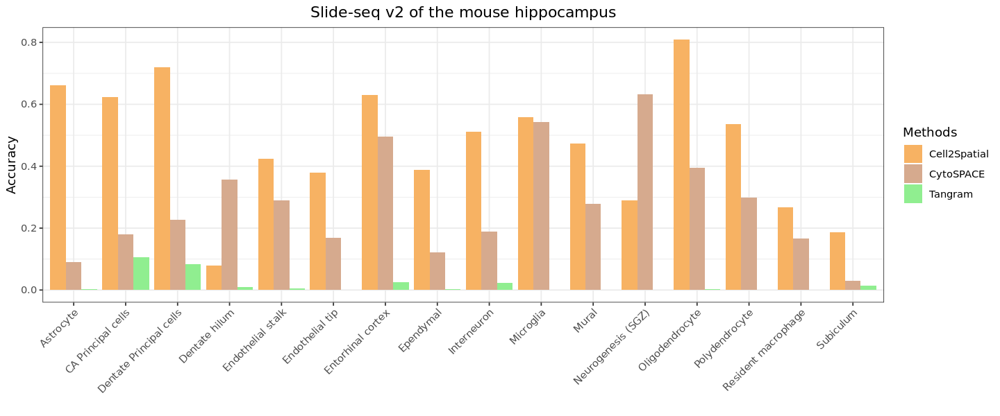

In [525]:
options(repr.plot.width = 12, repr.plot.height = 5)
ggplot(plot.df, aes(x = CellType, y = Accuracy, fill = Methods)) + geom_bar(stat = 'identity', position=position_dodge()) + theme_bw() + theme(axis.text.x = element_text(angle = 45, hjust = 1), plot.title = element_text(hjust = 0.5)) + scale_fill_manual(values = MTH_COLOR[c('Cell2Spatial', 'CytoSPACE', 'Tangram')]) + xlab('') + ggtitle('Slide-seq v2 of the mouse hippocampus')
ggsave(file.path(out.figs.dir, 'accruact.pdf'), width = 12, height = 5)

In [157]:
### Proportions

In [357]:
prop.cell2sp <-readRDS('st.prop.RDS')
prop.cell2sp <- colSums(prop.cell2sp) / sum(colSums(prop.cell2sp))

In [514]:
prop.cell2sp <- table(cell2spatial$Cell2Spatial) / sum(table(cell2spatial$Cell2Spatial))
prop.cyto <- table(cytospace$CellType) / sum(table(cytospace$CellType))
prop.tang <- table(tangram$celltypeNew) / sum(table(tangram$celltypeNew))
prop.seu <- table(seurat.res$predicted.id) / sum(table(seurat.res$predicted.id))

In [515]:
prop.seu
prop.cell2sp


              Astrocyte      CA Principal cells Dentate Principal cells 
           0.3156571702            0.0629638497            0.0512329423 
          Dentate hilum       Endothelial stalk         Endothelial tip 
           0.0049078286            0.0056021068            0.0118506105 
      Entorhinal cortex               Ependymal             Interneuron 
           0.2894421834            0.0178118267            0.0691884127 
              Microglia                   Mural      Neurogenesis (SGZ) 
           0.0099353603            0.0017237252            0.0021546565 
        Oligodendrocyte          Polydendrocyte     Resident macrophage 
           0.1382571223            0.0136940388            0.0007182188 
              Subiculum 
           0.0048599473 


              Astrocyte      CA Principal cells Dentate Principal cells 
            0.272939274             0.070355255             0.089086566 
          Dentate hilum       Endothelial stalk         Endothelial tip 
            0.002313204             0.004569989             0.005961672 
      Entorhinal cortex               Ependymal             Interneuron 
            0.213830327             0.008444135             0.058394298 
              Microglia                   Mural      Neurogenesis (SGZ) 
            0.020517932             0.004664021             0.017264401 
        Oligodendrocyte          Polydendrocyte     Resident macrophage 
            0.167039663             0.038478175             0.004156245 
              Subiculum 
            0.021984842 

In [516]:
intersect(names(prop.cyto), names(prop.seu))

[1] "Astrocyte"               "CA Principal cells"     
 [3] "Dentate Principal cells" "Dentate hilum"          
 [5] "Endothelial stalk"       "Endothelial tip"        
 [7] "Entorhinal cortex"       "Ependymal"              
 [9] "Interneuron"             "Microglia"              
[11] "Mural"                   "Neurogenesis (SGZ)"     
[13] "Oligodendrocyte"         "Polydendrocyte"         
[15] "Resident macrophage"     "Subiculum"

In [517]:
prop.tang[names(prop.seu)]


              Astrocyte      CA Principal cells Dentate Principal cells 
            0.141978579             0.230462097             0.251012376 
          Dentate hilum       Endothelial stalk         Endothelial tip 
            0.010029141             0.036010294             0.005601181 
      Entorhinal cortex               Ependymal             Interneuron 
            0.116735420             0.006377020             0.057431026 
              Microglia                   Mural      Neurogenesis (SGZ) 
            0.008836998             0.013340650             0.008666692 
        Oligodendrocyte          Polydendrocyte     Resident macrophage 
            0.041554706             0.019793362             0.001475987 
              Subiculum 
            0.050694471 

In [518]:
#plot.df <-cbind.data.frame(seurat = prop.seu, Cell2Spatial = prop.cell2sp[names(prop.seu)], CytoSPACE = prop.cyto[names(prop.seu)], Tangram = prop.tang[names(prop.seu)])#[, c(1, 2, 3, 5, 7)]
plot.df <-cbind.data.frame(seurat = prop.seu, Cell2Spatial = prop.cell2sp[names(prop.seu)], CytoSPACE = prop.cyto[names(prop.seu)], Tangram = prop.tang[names(prop.seu)])[, c(1, 2, 4, 6, 8)]

colnames(plot.df) <- c('CellType', 'Seurat', 'Cell2Spatial', 'CytoSPACE', 'Tangram')

In [522]:
plot.df

CellType,Seurat,Cell2Spatial,CytoSPACE,Tangram
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Astrocyte,0.3156571702,0.272939274,0.029042602,0.141978579
CA Principal cells,0.0629638497,0.070355255,0.035432891,0.230462097
Dentate Principal cells,0.0512329423,0.089086566,0.031195602,0.251012376
Dentate hilum,0.0049078286,0.002313204,0.100068713,0.010029141
Endothelial stalk,0.0056021068,0.004569989,0.004351809,0.036010294
Endothelial tip,0.0118506105,0.005961672,0.006642235,0.005601181
Entorhinal cortex,0.2894421834,0.213830327,0.336417774,0.116735420
Ependymal,0.0178118267,0.008444135,0.003229501,0.006377020
Interneuron,0.0691884127,0.058394298,0.040471828,0.057431026


In [520]:
gps <-lapply(c('Cell2Spatial', 'CytoSPACE', 'Tangram'), function(xx) {
    ggplot(plot.df, aes_string(x = 'Seurat', y = xx)) + geom_point(aes(color = CellType), size = 3) + geom_smooth(method = lm, color ='red') + stat_cor() + theme_bw() + theme(panel.grid = element_blank()) + scale_color_manual(values = cell.colors)  
})

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


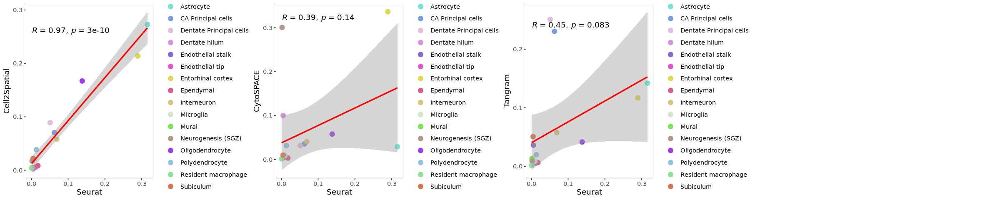

In [528]:
options(repr.plot.width = 20, repr.plot.height = 4)
ggarrange(plotlist = gps, ncol = 4)
ggsave(file.path(out.figs.dir, 'corr.pdf'), width = 20, height = 4)